# Identification
Please indicate your name

Student 1: Erisa Kohansal

Student 2: Sama Satariyan

# Practical work 4: Frequency filtering, color

In [1]:
import numpy as np
from numpy.fft import fft2,ifft2,fftshift, ifftshift
import matplotlib.pyplot as plt
from PIL import Image

def imshow(I,title=None,size=500):
    """ display an image with a specific size """
    plt.figure(figsize=(size//80,size//80))
    plt.gray()
    plt.imshow(I)
    if title: plt.title(title)
    plt.show()

def computeFT(I):
    """ Array -> Array[complex] """
    return fft2(I)

def toVisualizeFT(If):
    """ Array[complex] -> Array[float] """
    return np.abs(fftshift(If))

def toVisualizeLogFT(If):
    """ Array[complex] -> Array[float] """
    return np.log(1 + np.abs(fftshift(If)))   


## Exercise 1 - Frequency filtering

1. Compute than display the centered module of Fourier transform of `img/mandrill.png` (use functions seen in previous lessons). 

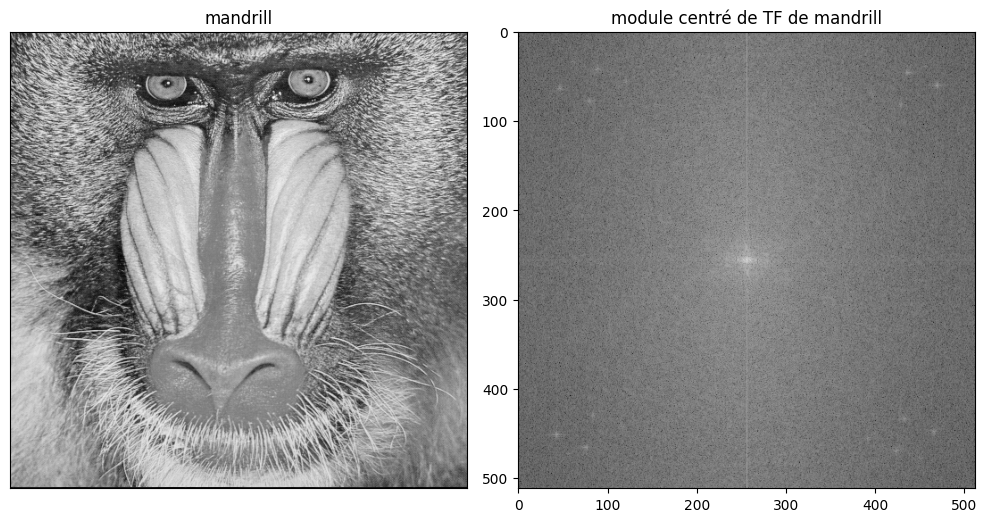

In [2]:
mandrill = np.array(Image.open("img/mandrill.png"))
mandrillLogFFT = toVisualizeLogFT(computeFT(mandrill))

fig = plt.figure(figsize=(10, 5))

sub1 = plt.subplot(1, 2, 1)
sub1.imshow(mandrill, cmap="gray")
sub1.set_title("mandrill")
sub1.set_xticks(())
sub1.set_yticks(())

sub2 = plt.subplot(1, 2, 2)
sub2.imshow(mandrillLogFFT, cmap="gray")
sub2.set_title("module centré de TF de mandrill")

fig.tight_layout()
plt.show()

2. Write a function `idealLowPassFilter(n,m,fc)` returning an ideal low pass filter with frequency cutoff $f_c$ and size $n\times m$. Recall: this function set to 1 pixels at Euclidian distance $f_c$ from the center (null frequency).

In [3]:
def idealLowPassFilter(n, m, fc):
    x, y = np.meshgrid(np.arange(n), np.arange(m))
    D0 = np.sqrt((x - n//2)**2 + (y - m//2)**2)
    return np.where(D0 <= fc, 1., 0.)

idealLowPassFilter(15, 15, 6)

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0.],
       [0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0.],
       [0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0.],
       [0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0.],
       [0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0.],
       [0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0.],
       [0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0.],
       [0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0.],
       [0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0.],
       [0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0.],
       [0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0.

3. Write a function `lowPass(I,fc)` performing a low pass filtering of an image $I$. The function should
 - compute the centered Fourier transform of $I$
 - multiply point-by-point the spectrum with the ideal low filter produced by `idealLowPassFilter()`
 - uncenter the filtered spectrum and apply the inverse Fourier transform (use function `ifft2()` from module `numpy.fft`)
 - return the real part of filtered image

In [4]:
def lowPass(I, fc):
    CFT = fftshift(fft2(I))
    ILPF = idealLowPassFilter(*CFT.shape, fc)
    mult = np.multiply(CFT, ILPF)
    res = ifft2(ifftshift(mult))
    return np.real(res)

4. Experiment this function on `img/mandrill.png` and `img/lena.jpg` with various values of cut off $f_c$.
 - give two effects that appears when $f_c$ decreases,
 - propose two applications of this filtering.


In [5]:
def affiche_exercice1(I, nI):
    fig, ax = plt.subplots(nrows=2, ncols=6, figsize=(15, 8))
    j = 0
    for fc in range(5, 56, 10):
        Ilp = lowPass(I, fc)
        ax[0, j].imshow(Ilp, cmap="gray")
        ax[0, j].set_title(f"{nI}, fc={fc}")
        ax[0, j].set_xticks(())
        ax[0, j].set_yticks(())
        ax[1, j].imshow(np.log(1+np.abs(fftshift(fft2(Ilp)))), cmap="gray")
        ax[1, j].set_title(f"TF de {nI} avec fc={fc}")
        ax[1, j].set_xticks(())
        ax[1, j].set_yticks(())
        j += 1
    fig.tight_layout()
    plt.show()

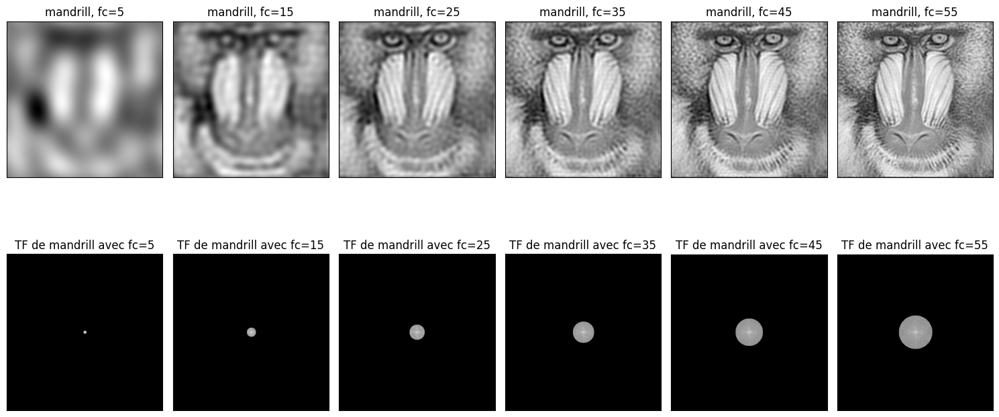

In [6]:
affiche_exercice1(mandrill, "mandrill")

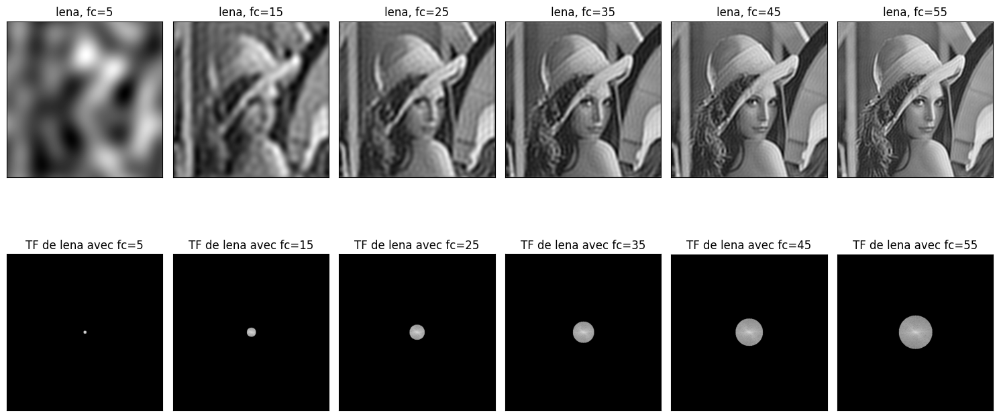

In [7]:
lena = np.array(Image.open("img/lena.jpg"))
affiche_exercice1(lena, "lena")

Plus $f_c$ diminue:
- l'image devient progressivement plus floue car seules les fréquences basses (correspondant aux zones uniformes de l'image, en terme de changement d'intensité) sont conservées, tandis que les détails fins, correspondant aux hautes fréquences, sont éliminés.
- plus les détails fins disparaissent plus l'image apparaît lisse et moins détaillée.

Application : 
- réduction du bruit : car le bruit se manifeste souvent à des hautes fréquences.
- pré-traitement de l'image : utile dans les cas où on souhaite réduire la quantité des petits détails dans une image et se concentrer sur les formes générales. exemple : la reconnaissance de motifs ou de visages.

## Exercise 2 -  Linear filtering (convolution)

1. Given a kernel convolution of size $d\times d$, $d$ being odd. How many lines and columns should be added to each side of the image to apply this filter? The image is supposed surrounded by zero values.

Pour un noyau de convolution de taille $d \times d$ où $d$ est impair, il faut ajouter $\frac{d-1}{2}$ lignes et colonnes de chaque côté de l'image. Donc, $d-1$ lignes et colonnes au total doivent être ajoutées.

2. Write a function `imagePad(I,h)` getting an image and a kernel, returning a new image padded with zeros according to question 1. It is not allowed to use a module implementing the padding.

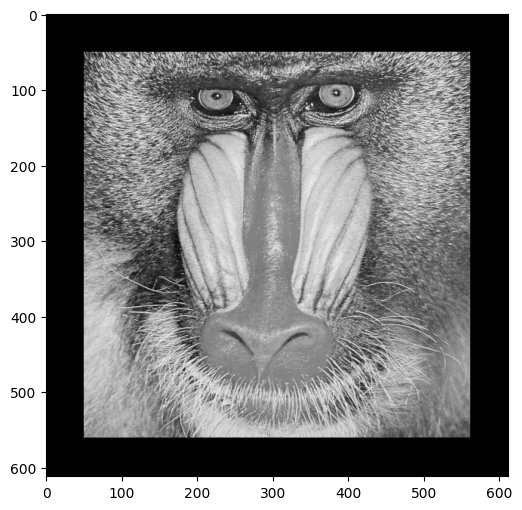

In [8]:
def imagePad(I, h):
    n, m = I.shape
    k, l = h.shape
    padded = np.zeros((n+k, m+l))
    for i in range(n):
        for j in range(m):
            padded[i + k//2, j + l//2] = I[i, j] 
    return padded

imshow(imagePad(mandrill, np.ones((100, 100))))

3. Write a function `conv2(I,h)` getting an image and a kernel and returning the convolution of $I$ by $h$. The function should return an image having the same shape than $I$. It is not allowed to use a module implementing the convolution.

In [9]:
def conv2(I, h):
    n, m = I.shape
    d = h.shape[0]
    padded_I = imagePad(I, h)
    mask_conv = np.flip(np.flip(h, axis=0), axis=1)
    convoluted = np.zeros((n, m))
    for k in range(n):
        for l in range(m):
            convoluted[k, l] = np.sum(np.dot(padded_I[k:k+d, l:l+d], mask_conv))
    return convoluted

4. Try this function on mean filter of size $3\times3$, $5\times 5$ and $7\times 7$. Discuss the results.

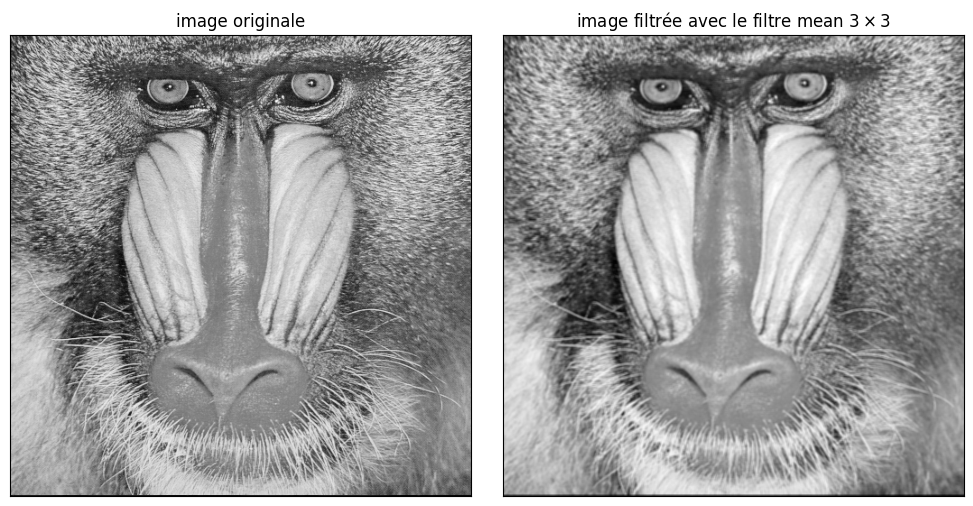

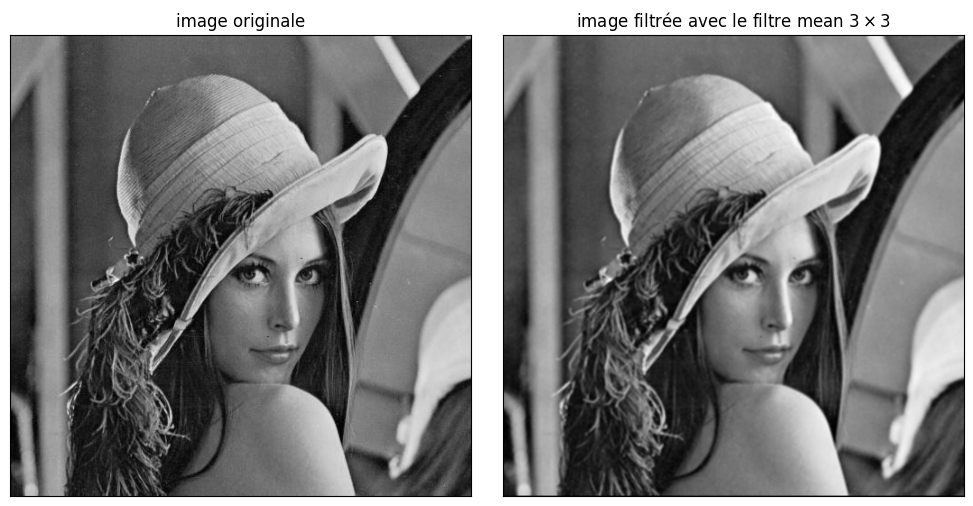

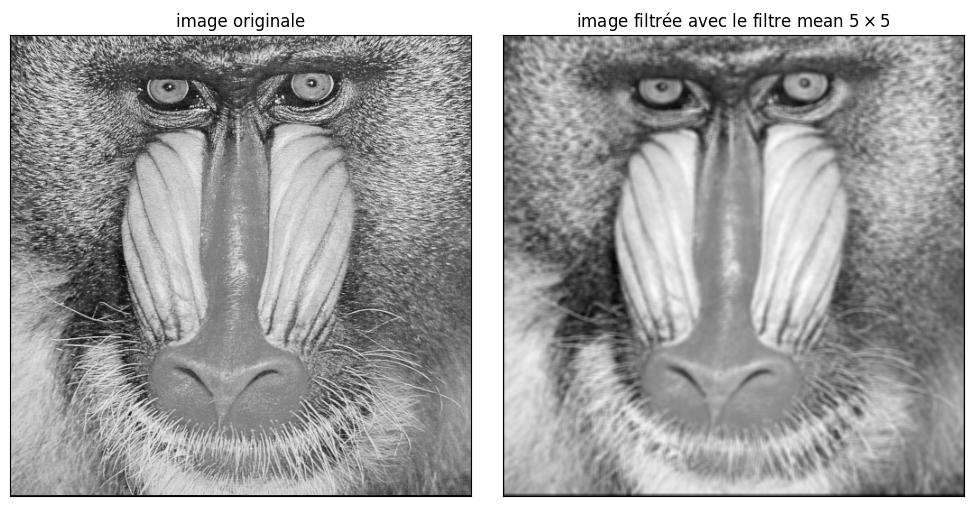

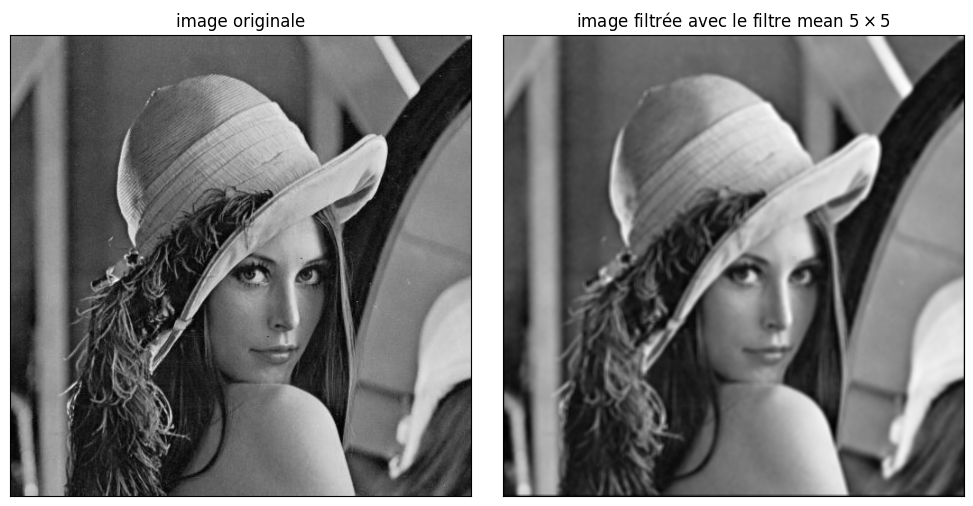

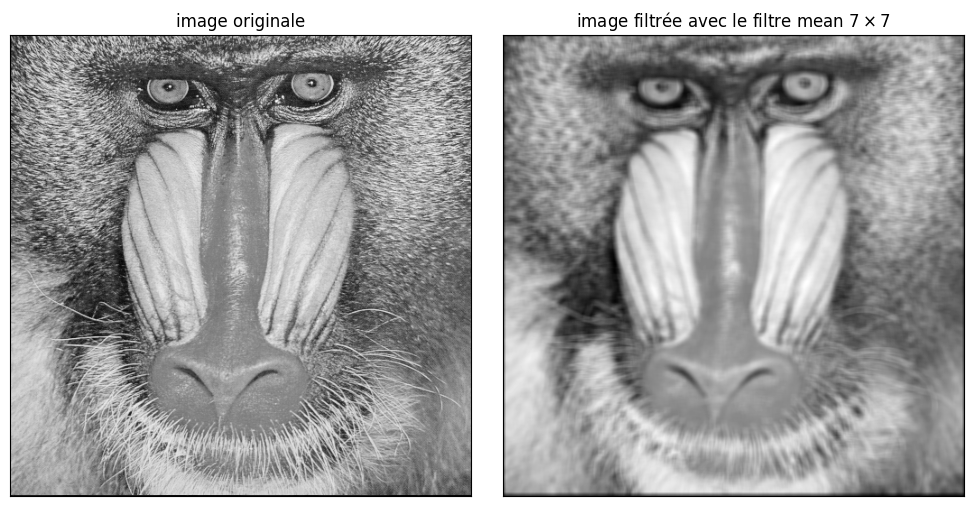

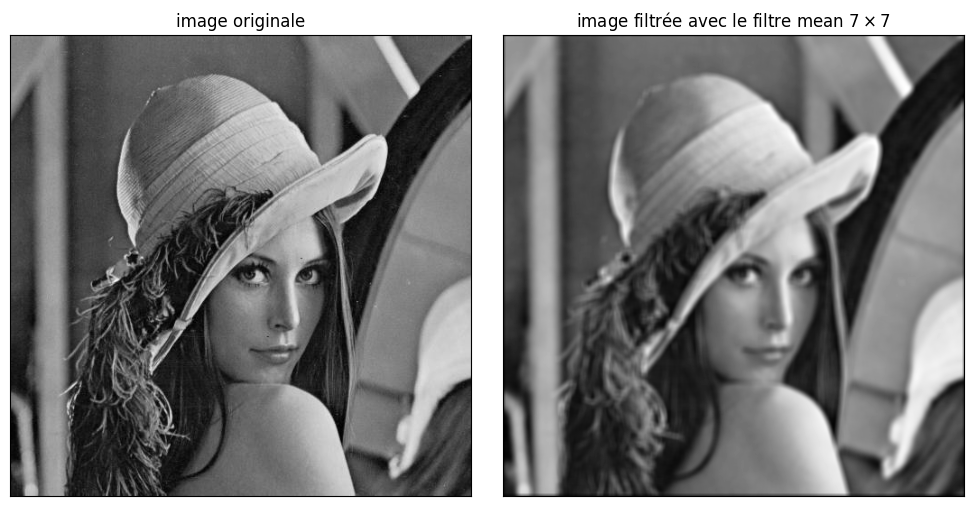

In [10]:
def affiche_mean_filter(I, d):
    mean_d = 1/(d*d) * np.ones((d, d))
    res = conv2(I, mean_d)

    fig = plt.figure(figsize=(10, 5))

    sub1 = plt.subplot(1, 2, 1)
    sub1.imshow(I, cmap="gray")
    sub1.set_title("image originale")
    sub1.set_xticks(())
    sub1.set_yticks(())

    sub2 = plt.subplot(1, 2, 2)
    sub2.imshow(res, cmap="gray")
    sub2.set_title(f"image filtrée avec le filtre mean ${d}\\times{d}$")
    sub2.set_xticks(())
    sub2.set_yticks(())

    fig.tight_layout()

    plt.show()

for d in [3, 5, 7]:
    affiche_mean_filter(mandrill, d)
    affiche_mean_filter(lena, d)

Plus la taille du filtre augmente, plus l'image devient flou et lisse. Les détails fins et les petits motifs de l'image sont alors progressivement supprimées car le filtre calcule la moyenne sur une plus grande zone. Donc, les différentes tailles des filtres moyens permettent de contrôler le niveau de lissage(smoothing) d'une image.

5. Display the transfert function of these mean filters. For a better visualization, use the zero-padding technique to obtain a filter with a large size (for instance $256\times 256$). Use `imshow()` and `toVisualizeLogFT()`.

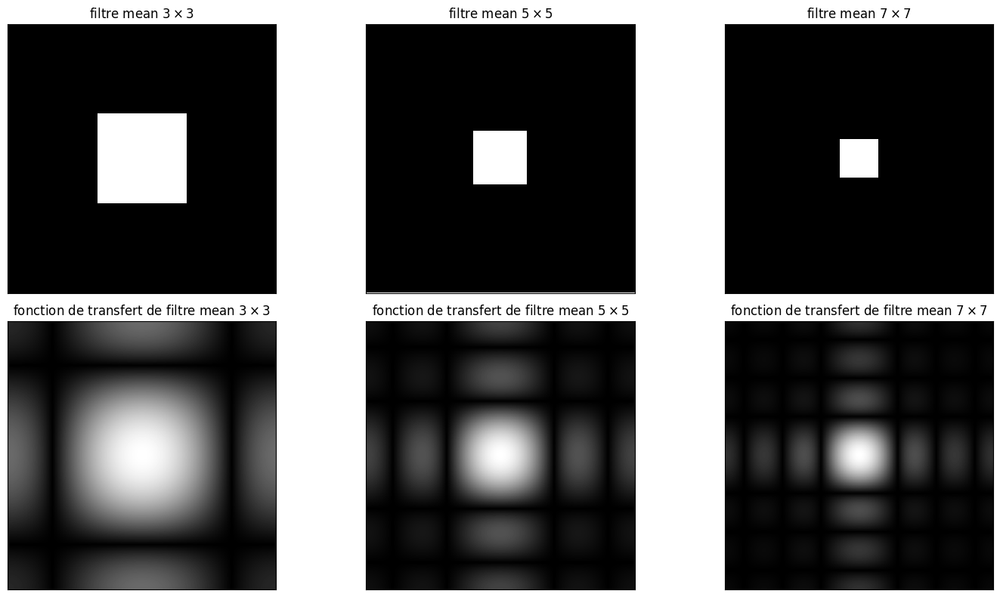

In [11]:
# transfer function of a filter : FT of the filter

kernel = 1/(256*256) * np.ones((256, 256))
j = 0
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(15, 8))
for dim in [3, 5, 7]:
    mean_filter = 1/(dim*dim) * np.ones((dim, dim))
    transfer = toVisualizeLogFT(computeFT(mean_filter))
    padded_mean = imagePad(mean_filter, kernel)
    padded_transfer = toVisualizeLogFT(computeFT(padded_mean))
    ax[0, j].imshow(transfer, cmap="gray")
    ax[0, j].set_title(f"filtre mean ${dim} \\times {dim}$")
    ax[0, j].set_xticks(())
    ax[0, j].set_yticks(())
    ax[1, j].imshow(padded_transfer, cmap="gray")
    ax[1, j].set_title(f"fonction de transfert de filtre mean ${dim} \\times {dim}$")
    ax[1, j].set_xticks(())
    ax[1, j].set_yticks(())
    j += 1
fig.tight_layout()
plt.show()

6. Interpretation: what is the analytic expression of the transfert function of a mean filter? Is  it an ideal low pass filter?

- La fonction de transfert est une fonction $sinc$. Cela vient du fait que la convolution avec un filtre rectangulaire (la fonction porte) dans le domaine spatial correspond à une multiplication par la fonction $sinc$ dans le domaine fréquentiel. En effet, le filtre mean est une sorte de fonction porte, car sa réponse impulsionnelle est définie comme ayant la valeur $\frac{1}{d^2}$ dans la fenêtre couverte lorsque le filtre est centré sur l'origine, et $0$ sinon ($d$ étant la dimension du filtre). Ainsi, filtrer une image par un filtre mean revient à calculer la convolution de l'image avec la fonction porte dans le domaine spatial, ce qui équivaut à multiplication de la transformée de Fourier de l'image par la fonction $sinc$ associée dans le domaine fréquentiel.

$$
    \text{h}(n,m) = \text{Rect}(n,m) = 
    \begin{cases}
        \frac{1}{d^2} & \text{si } -\frac{d-1}{2} \leq (n,m) \leq \frac{d-1}{2} \\
        0 & \text{sinon}
    \end{cases}
$$

- Le filtre moyen est un passe-bas qui permet de supprimer les hautes fréquences, mais il laisse des lobes secondaires (= des oscillations après le lobe principal). En revanche, un filtre passe-bas idéal bloque complètement les hautes fréquences sans oscillations secondaires. En plus de cela, un filtre pass-bas idéal correspondrait à une convolution de l'image par la fonction Bessel de premier ordre (=similaire à une version "circulaire" de la fonction $sinc$) dans le domaine spatial, ce qui n'est pas le cas ici.

7. Bonus question: perform the same study for the Gaussian kernel. Determine $\sigma$ in order to have filter of size $3\times3$, $5\times5$, and $7\times7$.

taille de filtre $= 2 \times \lceil 3 \times \sigma \rceil + 1$

donc pour :
- $3 = 2 \times \lceil 3 \times \sigma \rceil +1$, et donc la plage de valeurs possibles de $\sigma$ est l'intervalle $(0;\frac{1}{3}]$
- $5 = 2 \times \lceil 3 \times \sigma \rceil +1$, et donc la plage de valeurs possibles de $\sigma$ est l'intervalle $(\frac{1}{3};\frac{2}{3}]$
- $7 = 2 \times \lceil 3 \times \sigma \rceil +1$, et donc la plage de valeurs possibles de $\sigma$ est l'intervalle $(\frac{2}{3};1]$

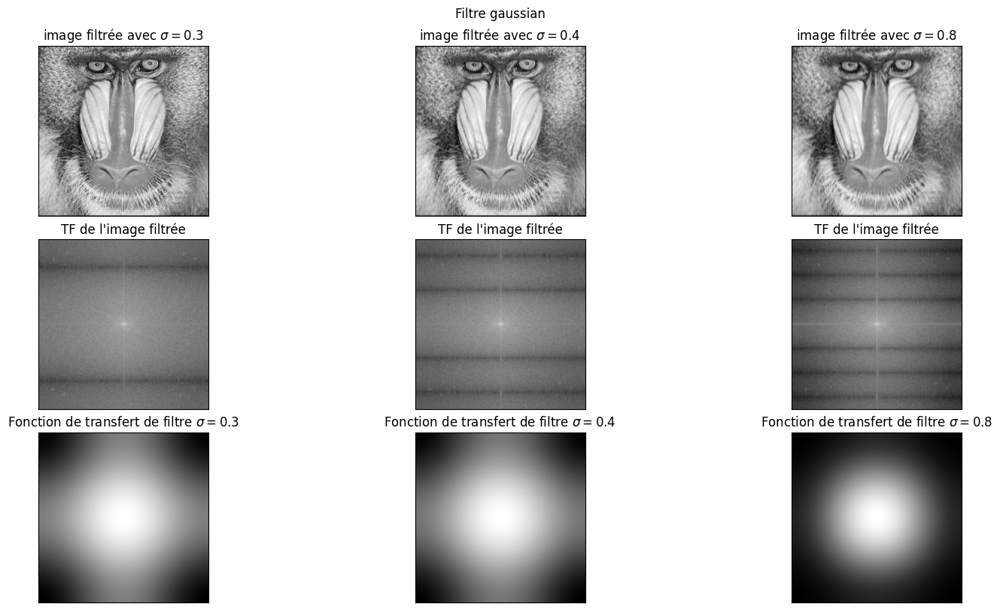

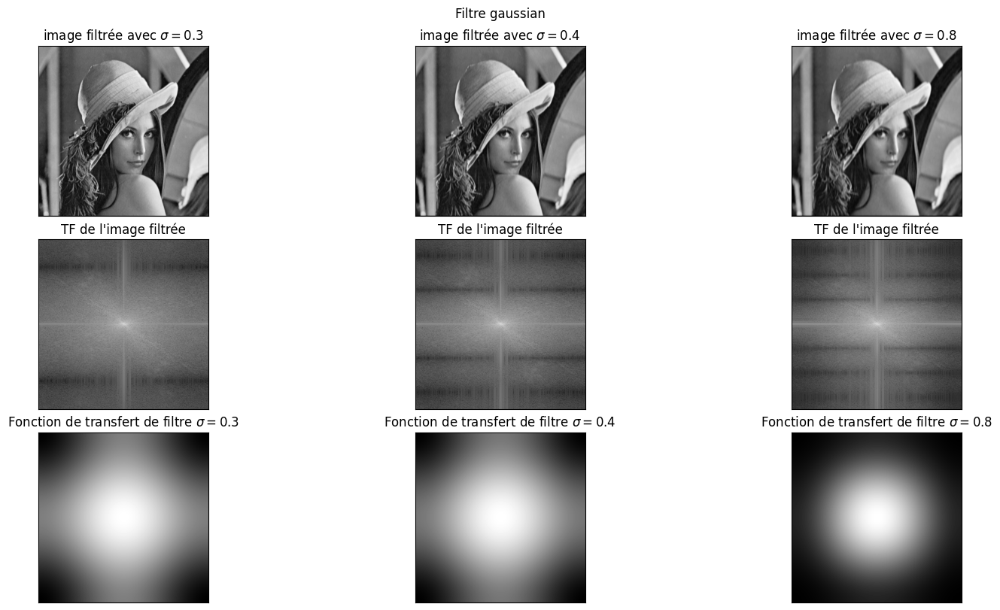

In [12]:
def gaussianKernel(sigma):
    """ double -> Array
        return a gaussian kernel of standard deviation sigma
    """
    n2 = int(np.ceil(3*sigma))
    x,y = np.meshgrid(np.arange(-n2,n2+1),np.arange(-n2,n2+1))
    kern = np.exp(-(x**2+y**2)/(2*sigma*sigma))
    return  kern/kern.sum()
### your answer start below
sigmas = [1/3, 1/3+0.1, 2/3+0.1]
kernel = 1/(256*256) * np.ones((256, 256))
for img in [mandrill, lena]:
    fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(15, 8), constrained_layout=1)
    fig.suptitle("Filtre gaussian")
    for ind in range(len(sigmas)):
        gauss = gaussianKernel(sigmas[ind])
        res = conv2(img, gauss)

        # première ligne : image résultante
        ax[0, ind].imshow(res, cmap="gray")
        ax[0, ind].set_title("image filtrée avec $\sigma={:.1f}$".format(sigmas[ind]))
        ax[0, ind].set_xticks(())
        ax[0, ind].set_yticks(())

        # deuxième ligne : ft de conv
        ax[1, ind].imshow(toVisualizeLogFT(computeFT(res)), cmap="gray")
        ax[1, ind].set_title("TF de l'image filtrée")
        ax[1, ind].set_xticks(())
        ax[1, ind].set_yticks(())

        # troisième ligne : transfer function de kernel
        ax[2, ind].imshow(toVisualizeLogFT(computeFT(imagePad(gauss, kernel))))
        ax[2, ind].set_title("Fonction de transfert de filtre $\sigma={:.1f}$".format(sigmas[ind]))
        ax[2, ind].set_xticks(())
        ax[2, ind].set_yticks(())

    #fig.tight_layout()
    plt.show()


- Le filtre Gaussien est utilisé pour lisser l'image en appliquant une moyenne pondérée, c'est-à-dire que le poids(=contribution) du voisinage dépend de sa distance au pixel central. Plus la valeur de $\sigma$ augmente, plus les détails fins et les motifs de l'image sont atténués. Il s'agit d'un compromis entre la réduction du bruit et la préservation des détails.

- La fonction de transfert d'un filtre gaussien est également une gaussienne. Ce filtre est un filtre passe-bas, mais ce n'est pas un passe-bas idéal car il n'élimine pas complètement les hautes fréquences, il les atténue progressivement. Ainsi, le filtre gaussien réduit les fréquences au-delà de la fréquence de coupure $f_c$​ sans les supprimer totalement. En d'autres termes, l'affichage de la fonction de transfert du filtre gaussien prend la forme d'un cercle, similaire à celle d'un passe-bas idéal, mais plus lisse autour de la coupure. C'est pourquoi les effets des filtres gaussiens sur les images sont moins brusques, car les fréquences conservées sont plus largement réparties dans le domaine fréquentiel. L'image résultante reste donc plus reconnaissable. Bien que le filtre gaussien soit proche d'un filtre passe-bas idéal, il ne l'est pas entièrement, car sa réponse fréquentielle n'est pas bornée.

## Exercise 3: anti aliasing filtering

1. Give a code that subsamples of factor 2 (use function `subSample2()` given in TME3) the image `img/barbara.png`.

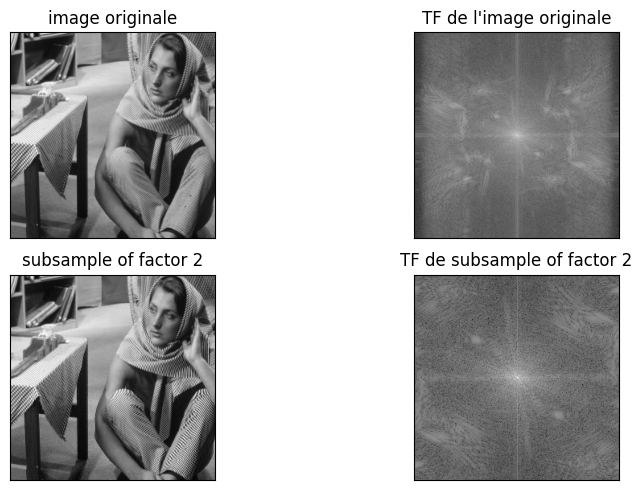

In [13]:
def subSample2(I):
    return I[::2,::2]

barbara = np.array(Image.open("img/barbara.png"))

fig = plt.figure(figsize=(10, 5))

sub1 = plt.subplot(2, 2, 1)
sub1.imshow(barbara, cmap="gray")
sub1.set_title("image originale")
sub1.set_xticks(())
sub1.set_yticks(())

sub2 = plt.subplot(2, 2, 2)
sub2.imshow(toVisualizeLogFT(computeFT(barbara)), cmap="gray")
sub2.set_title("TF de l'image originale")
sub2.set_xticks(())
sub2.set_yticks(())

sub3 = plt.subplot(2, 2, 3)
sub3.imshow(subSample2(barbara), cmap="gray")
sub3.set_title("subsample of factor 2")
sub3.set_xticks(())
sub3.set_yticks(())

sub4 = plt.subplot(2, 2, 4)
sub4.imshow(toVisualizeLogFT(computeFT(subSample2(barbara))), cmap="gray")
sub4.set_title("TF de subsample of factor 2")
sub4.set_xticks(())
sub4.set_yticks(())

fig.tight_layout()

plt.show()

2. Give a code that subsamples of factor 2 (use function `subSample2()`) the image `img/barbara.png` after applying an low pass filter (use `antiAliasingFilter()`). As comment, recall the principle of filtering in the frequency domain.

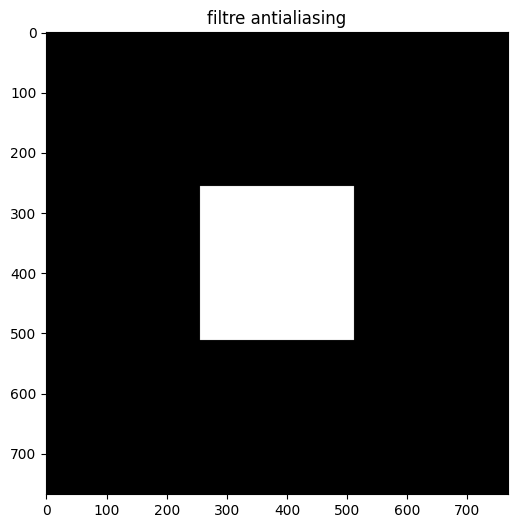

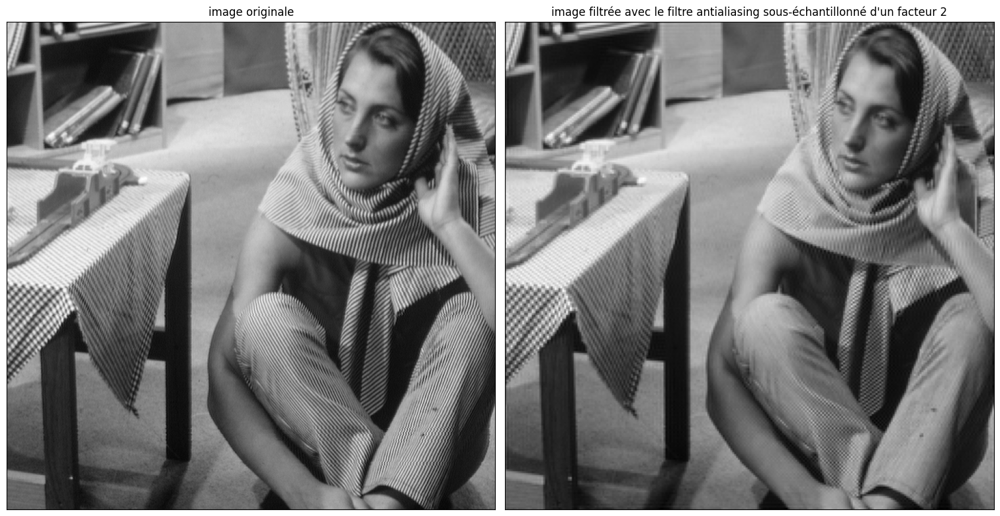

In [14]:
def antiAliasingFilter(n,m):
    """ int*int -> Array """
    n2, m2 = n//2, m//2
    rn, rm = n//4, m//4
    A = np.zeros((n, m))
    A[rn:rn+n2, rm:rm+m2] = 1
    return A
### your answer start below
DFT_X = fftshift(fft2(barbara))
H = antiAliasingFilter(*DFT_X.shape)
mult = np.multiply(DFT_X, H)
res = ifft2(ifftshift(mult))
Xfiltree = np.real(res)

imshow(imagePad(H, kernel), "filtre antialiasing")

fig = plt.figure(figsize=(15, 8), constrained_layout=1)

sub1 = plt.subplot(1, 2, 1)
sub1.imshow(barbara, cmap="gray")
sub1.set_title("image originale")
sub1.set_xticks(())
sub1.set_yticks(())

sub2 = plt.subplot(1, 2, 2)
sub2.imshow(subSample2(Xfiltree), cmap="gray")
sub2.set_title("image filtrée avec le filtre antialiasing sous-échantillonné d'un facteur 2")
sub2.set_xticks(())
sub2.set_yticks(())

plt.show()

Principe de filtrage dans le domaine fréquentiel : 
1. $X = DFT[x]$, calcul de la transformée de Fourier discrète de l'image
2. $H = DFT[h]$, calcul de la fonction de transfert(=la transformée de Fourier discrète de la réponse impulsionnelle $h$) du filtre 
3. $X$ et $H$ doivent avoir la même taille, zero-padding si nécessaire
4. $X_{filtrée} (f, g) = X(f, g) \times H(f,g)$, multiplication point par point
5. $x_{filtrée} = IDFT[X_{filtrée}]$, application de la transformée de Fourier inverse à $X_{filtrée}$ pour reconstruire le signal filtré $x_{filtrée}$

3. Describe and analyze the filtering of Barbara with and without the anti aliasing filter. What information is lost for the two filtered images ?

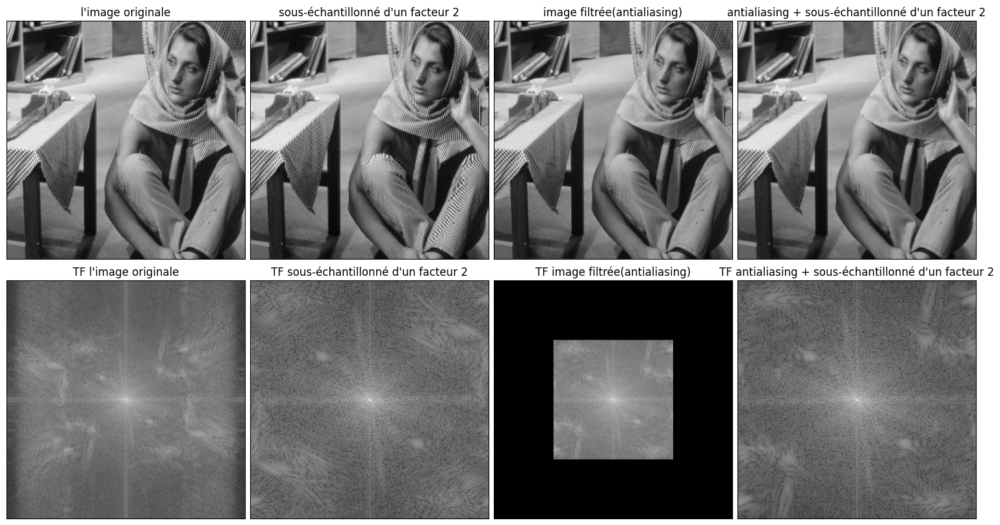

In [15]:
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(15, 8), constrained_layout=1)
toShow = {"l'image originale":barbara, "sous-échantillonné d'un facteur 2":subSample2(barbara), "image filtrée(antialiasing)":Xfiltree, "antialiasing + sous-échantillonné d'un facteur 2":subSample2(Xfiltree)}
i = 0
for title, img in toShow.items():
    ax[0, i].imshow(img, cmap="gray")
    ax[0, i].set_title(title)
    ax[0, i].set_xticks(())
    ax[0, i].set_yticks(())

    ax[1, i].imshow(toVisualizeLogFT(computeFT(img)), cmap="gray")
    ax[1, i].set_title("TF " + title)
    ax[1, i].set_xticks(())
    ax[1, i].set_yticks(())
    i += 1
plt.show()

Le filtre antialiasing est un filtre passe-bas qui est utilisé avant le sous-échantillonnage.

Les rayures (présentes sur le pantalon de Lena, ainsi que sur son écharpe et la nappe) sont mieux préservées lorsque le filtre antialiasing est appliqué avant le sous-échantillonnage, comparé à un sous-échantillonnage direct de l'image. Bien qu'elles soient légèrement moins définies par rapport à l'image d'origine, elles restent bien distinguables. En revanche, lorsqu'on sous-échantillonne l'image sans appliquer de filtre antialiasing, l'orientation des rayures devient incorrecte.
La résolution est réduite dans les deux cas mais la qualité visuelle de l'image qui a été filtrée d'abord est mieux que celle qu'on a sous-échantillonné sans appliquer le filtre. Cela signifie que le filtre passe-bas appliqué a permis de limiter la perte de qualité qui pourrait résulter de l'aliasing.

De plus, on observe des points noirs présents dans la transformée de Fourier de l'image sous-échantillonnée ce qui confirme le fait que l'image a été sous-échantillonnée.

## Exercise 4: color image
1. Read images `img/clown.bmp` and `img/clown_lumi.bmp` as two arrays named $I_1$ and $I_2$. Display these images and examine their shape. What difference there are between them?

I1 shape : (512, 512, 3)
I2 shape : (512, 512)


<function matplotlib.pyplot.show(close=None, block=None)>

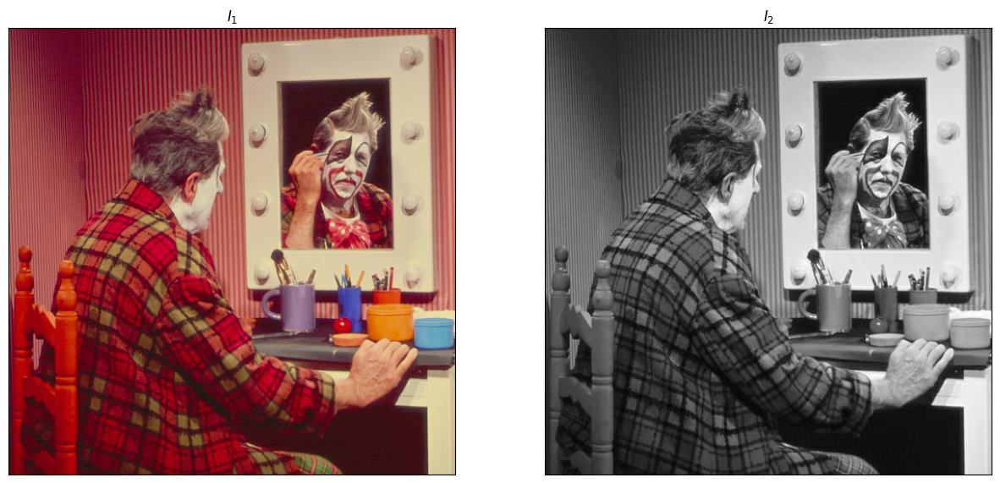

In [16]:
I1 = np.array(Image.open("img/clown.bmp"))
I2 = np.array(Image.open("img/clown_lumi.bmp"))

print(f"I1 shape : {I1.shape}")
print(f"I2 shape : {I2.shape}")

fig = plt.figure(figsize=(15, 8))
sub1 = plt.subplot(1, 2, 1)
sub1.imshow(I1)
sub1.set_title("$I_1$")
sub1.set_xticks(())
sub1.set_yticks(())
sub2 = plt.subplot(1, 2, 2)
sub2.imshow(I2, cmap="gray")
sub2.set_title("$I_2$")
sub2.set_xticks(())
sub2.set_yticks(())
plt.show

L'image colorée `clown` a trois canaux, un pour la couleur rouge, un pour la couleur verte et un pour la couleur bleue. L'image `clown_lumi` est donc la version en niveaux de gris de l'image `clown`, sans les informations de couleur.

2. The first image is an array of dimension 3. Explain the signification of each dimension. From this image create 3 images $I_R$, $I_G$, $I_B$ of dimension 2. Display these three images and explain what you see.

<function matplotlib.pyplot.show(close=None, block=None)>

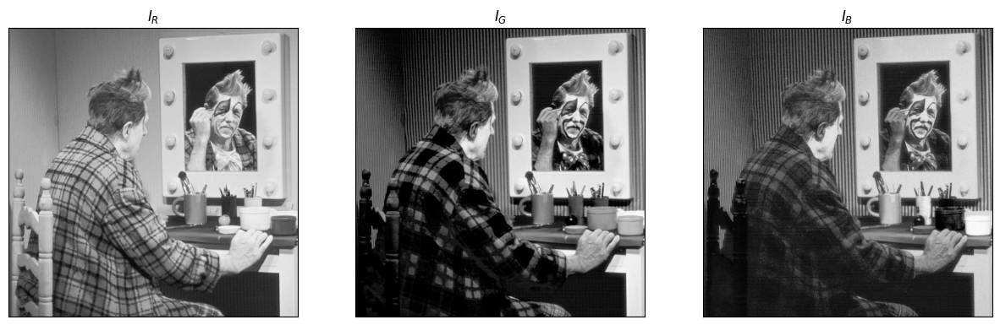

In [17]:
IR = I1[:,:,0]
IG = I1[:,:,1]
IB = I1[:,:,2]

fig = plt.figure(figsize=(15, 8))

sub1 = plt.subplot(1, 3, 1)
sub1.imshow(IR)
sub1.set_title("$I_R$")
sub1.set_xticks(())
sub1.set_yticks(())

sub2 = plt.subplot(1, 3, 2)
sub2.imshow(IG)
sub2.set_title("$I_G$")
sub2.set_xticks(())
sub2.set_yticks(())

sub3 = plt.subplot(1, 3, 3)
sub3.imshow(IB)
sub3.set_title("$I_B$")
sub3.set_xticks(())
sub3.set_yticks(())

plt.show

- première dimension correspond à la hauteur de l'image
- deuxième dimension correspond à la largeur de l'image
- troisième dimension représente les trois canaux de couler : rouge, vert et blue.

En extrayant les canaux $I_R$, $I_G$, et $I_B$, nous obtenons trois images en niveaux de gris, où chaque image montre les intensités lumineuses capturées par chaque canal. Les zones les plus lumineuses dans chaque image représentent des parties où cette couleur est dominante.

3. Create a new image $I_3$ of dimensions 3, the first dimension contains the value of $I_R$, the second the value of $I_B$ and the third the values of $I_G$. Try another combinations. Remark: color images are better handled by `imshow()` if pixel values range in $[0,1]$.

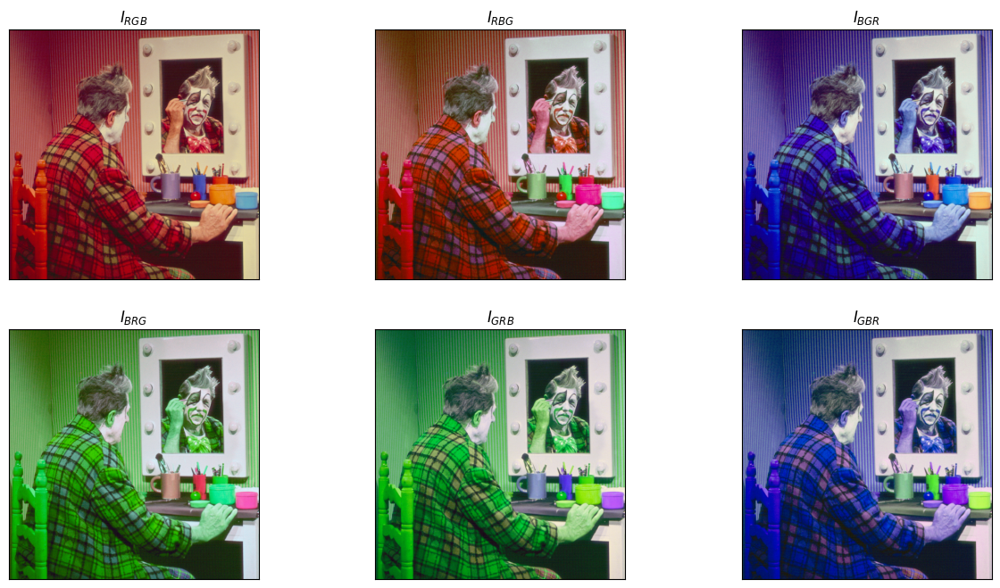

In [18]:
I3 = np.zeros((512, 512, 3))
IR_normalized = (IR-IR.min())/(IR.max()-IR.min())
IG_normalized = (IG-IG.min())/(IG.max()-IG.min())
IB_normalized = (IB-IB.min())/(IB.max()-IB.min())

# 6 différentes combinaisons possibles : RGB, RBG, BGR, BRG, GRB, GBR
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(15, 8))

# première combinaison : RGB, correspond à l'image I1
ax[0, 0].imshow(I1)
ax[0, 0].set_title("$I_{RGB}$")
ax[0, 0].set_xticks(())
ax[0, 0].set_yticks(())

# deuxième combinaison : RBG
I3[:,:,0] = IR_normalized
I3[:,:,1] = IB_normalized
I3[:,:,2] = IG_normalized
ax[0, 1].imshow(I3)
ax[0, 1].set_title("$I_{RBG}$")
ax[0, 1].set_xticks(())
ax[0, 1].set_yticks(())

#troisième combinaison : BGR
I3[:,:,0] = IB_normalized
I3[:,:,1] = IG_normalized
I3[:,:,2] = IR_normalized
ax[0, 2].imshow(I3)
ax[0, 2].set_title("$I_{BGR}$")
ax[0, 2].set_xticks(())
ax[0, 2].set_yticks(())

#quatrième combinaison : BRG
I3[:,:,0] = IB_normalized
I3[:,:,1] = IR_normalized
I3[:,:,2] = IG_normalized
ax[1, 0].imshow(I3)
ax[1, 0].set_title("$I_{BRG}$")
ax[1, 0].set_xticks(())
ax[1, 0].set_yticks(())

#cinquième combinaison : GRB
I3[:,:,0] = IG_normalized
I3[:,:,1] = IR_normalized
I3[:,:,2] = IB_normalized
ax[1, 1].imshow(I3)
ax[1, 1].set_title("$I_{GRB}$")
ax[1, 1].set_xticks(())
ax[1, 1].set_yticks(())

# sixième combinaison : GBR
I3[:,:,0] = IG_normalized
I3[:,:,1] = IB_normalized
I3[:,:,2] = IR_normalized
ax[1, 2].imshow(I3)
ax[1, 2].set_title("$I_{GBR}$")
ax[1, 2].set_xticks(())
ax[1, 2].set_yticks(())

plt.imshow(I3)

4. Write a code that allows the see the first channel with red color scales, the second channel in green color scales, and the blue channel in blue color scales.

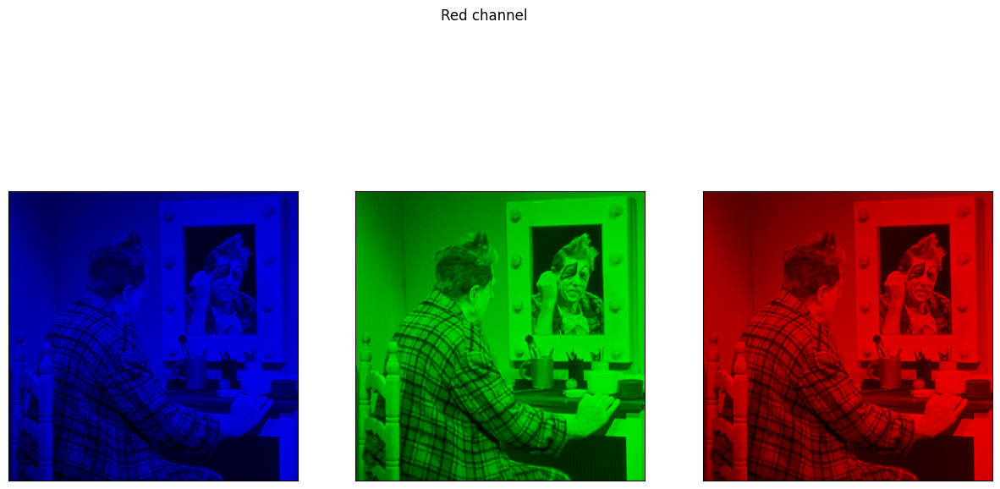

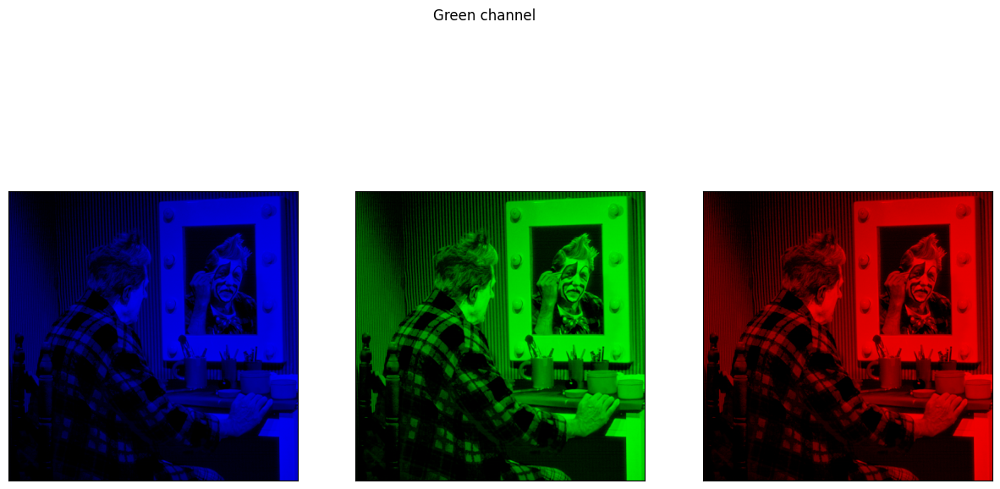

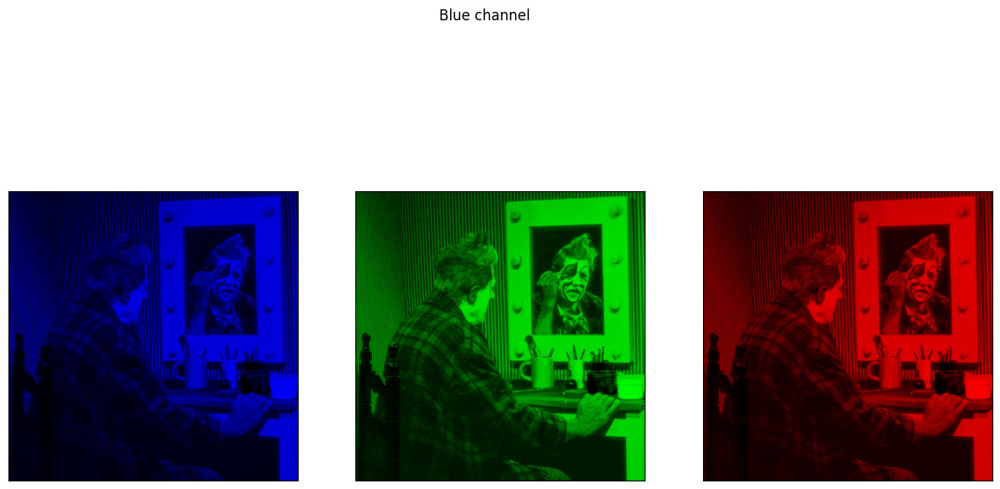

In [19]:
zeros = np.zeros(I1.shape[:2])
for channel, vals in {"Red channel":IR_normalized, "Green channel":IG_normalized, "Blue channel":IB_normalized}.items():
    fig = plt.figure(figsize=(15, 8))
    fig.suptitle(f"{channel}")

    sub1 = plt.subplot(1, 3, 1)
    sub1.imshow(np.array([zeros, zeros, vals.T]).T)
    sub1.set_xticks(())
    sub1.set_yticks(())

    sub2 = plt.subplot(1, 3, 2)
    sub2.imshow(np.array([zeros, vals.T, zeros]).T)
    sub2.set_xticks(())
    sub2.set_yticks(())

    sub3 = plt.subplot(1, 3, 3)
    sub3.imshow(np.array([vals.T, zeros, zeros]).T)
    sub3.set_xticks(())
    sub3.set_yticks(())

    plt.show()
